# dataloader测试

## 引入package

In [1]:
import os  
import detectron2.utils.comm as comm 
from detectron2.checkpoint import DetectionCheckpointer 
from detectron2.config import get_cfg 
from detectron2.data import build_detection_test_loader, build_detection_train_loader 
from detectron2.engine import DefaultTrainer, default_argument_parser, default_setup, launch 
from detectron2.evaluation import PascalVOCDetectionEvaluator, DatasetEvaluators, verify_results 
from detectron2.utils.logger import setup_logger  

from multitask import DatasetMapper, add_multitask_config

## 加载参数,创建loader

In [19]:
import torch
torch.cuda.set_device(1)

In [20]:
config_file = "configs/Base-MULTITASK-RCNN-FPN.yaml"

In [21]:
def setup(config_file):     
    cfg = get_cfg()  # 默认配置     
    add_multitask_config(cfg)     
    cfg.merge_from_file(config_file)     
    cfg.freeze()     
    # default_setup(cfg, args)     # Setup logger for "multitask" module     
    setup_logger(output=cfg.OUTPUT_DIR, distributed_rank=comm.get_rank(), name="multitask") 
    return cfg 

In [22]:
cfg = setup(config_file)

Config 'configs/Base-MULTITASK-RCNN-FPN.yaml' has no VERSION. Assuming it to be compatible with latest v2.


In [23]:
train_loader = build_detection_train_loader(cfg, mapper=DatasetMapper(cfg, True))

In [24]:
_data_loader_iter = iter(train_loader)

In [25]:
_data_loader_iter

In [26]:
data = next(_data_loader_iter)

In [27]:
data[0]

{'file_name': 'datasets/VOC_AL/JPEGImages/20180922140257.jpg',
 'image_id': '20180922140257',
 'height': 1920,
 'width': 2560,
 'multi_label_names': ['ZaSe'],
 'image': tensor([[[189., 186., 182.,  ..., 188., 190., 192.],
          [184., 190., 191.,  ..., 176., 182., 190.],
          [179., 176., 179.,  ..., 177., 181., 189.],
          ...,
          [152., 150., 135.,  ..., 157., 157., 161.],
          [145., 141., 140.,  ..., 167., 178., 184.],
          [135., 141., 144.,  ..., 164., 172., 179.]],
 
         [[205., 202., 198.,  ..., 199., 201., 203.],
          [200., 206., 207.,  ..., 187., 193., 201.],
          [195., 192., 195.,  ..., 188., 192., 200.],
          ...,
          [174., 172., 157.,  ..., 169., 169., 173.],
          [167., 163., 162.,  ..., 179., 190., 196.],
          [157., 163., 166.,  ..., 176., 184., 191.]],
 
         [[144., 141., 137.,  ..., 131., 133., 135.],
          [139., 145., 146.,  ..., 119., 125., 133.],
          [134., 131., 134.,  ..., 120.,

In [43]:
# 此处的确不加载，到RCNN模型架构的时候再加载
data[0]['image'].device

device(type='cpu')

## 可视化进行验证

In [50]:
import numpy as np   
import cv2   
import random  
from google.colab.patches import cv2_imshow

### 原图

In [48]:
src_img = cv2.imread(data[0]['file_name'])

In [49]:
src_img.shape

(1920, 2560, 3)

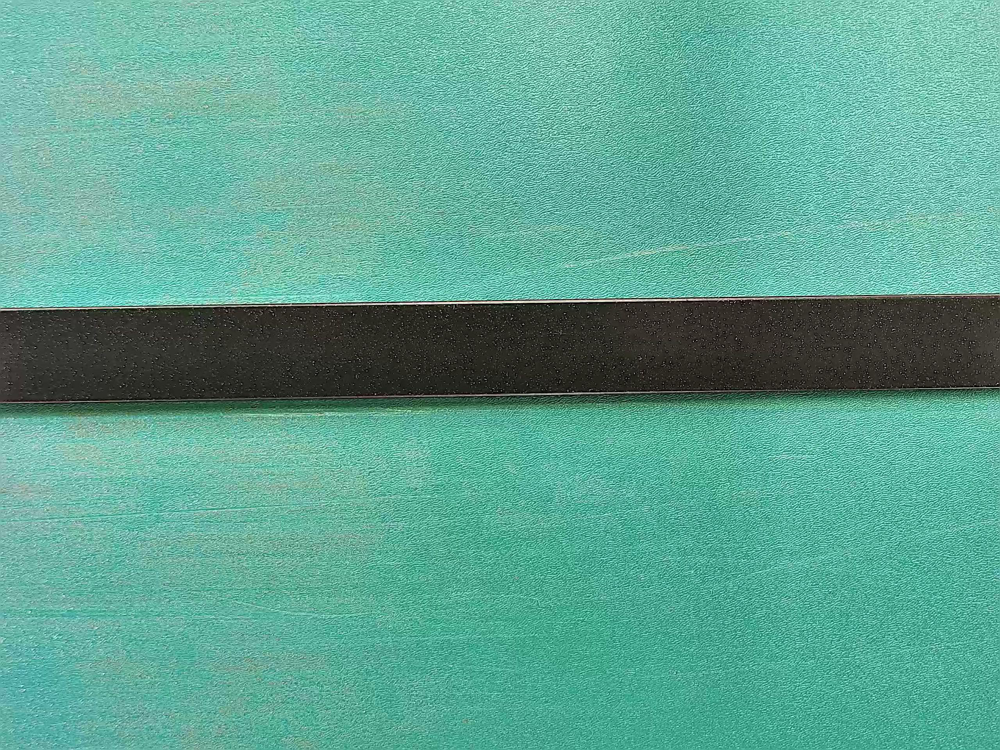

In [46]:
cv2_imshow(src_img)

## dataloader 出图

In [30]:
tensor_img = data[0]['image']

In [32]:
np_img = tensor_img.numpy()

In [51]:
np_img.shape

(3, 640, 853)

In [52]:
bgr = np_img.transpose(1,2,0)
bgr.shape

(640, 853, 3)

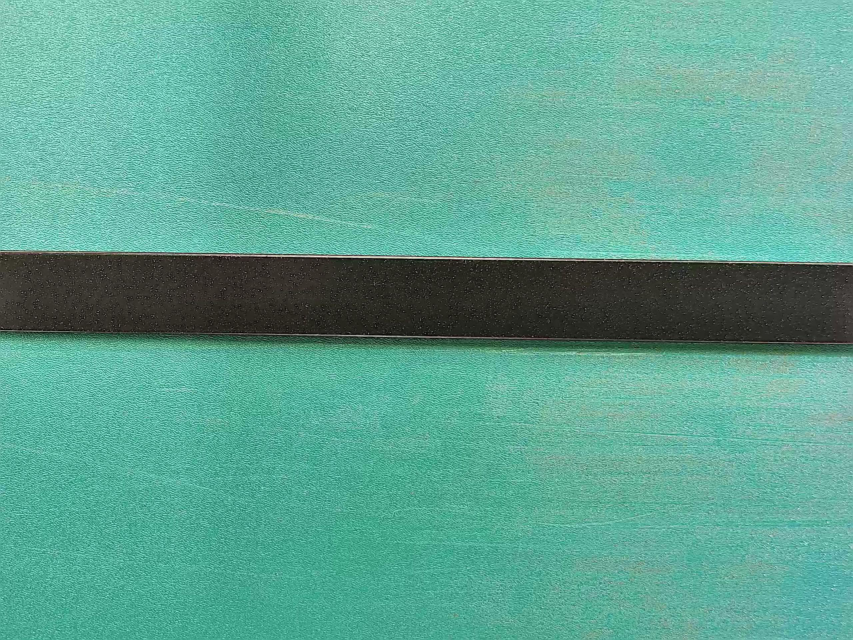

In [53]:
cv2_imshow(bgr)

## bbox确认

In [56]:
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.utils.visualizer import Visualizer
import multitask

In [57]:
dataset_name = "voc_al_train" 
metadata = MetadataCatalog.get(dataset_name)

In [54]:
instance = data[0]['instances']

In [64]:
boxes = instance.gt_boxes
print(boxes);
print(boxes.tensor);

Boxes(tensor([[  0.0000, 252.6667, 853.0000, 344.6667]]))
tensor([[  0.0000, 252.6667, 853.0000, 344.6667]])


In [69]:
bbox = boxes.tensor.numpy().flatten()

In [70]:
bbox.shape

(4,)

In [76]:
gt_class = instance.gt_classes.numpy()

In [78]:
from detectron2.structures.boxes import BoxMode

In [79]:
dic = {
            "annotations": [
                {
                    "bbox": [
                        bbox[0],
                        bbox[1],
                        bbox[2],
                        bbox[3],
                    ],
                    "bbox_mode": BoxMode.XYXY_ABS,
                    "category_id": gt_class[0],
                    "iscrowd": 0,
                }
            ],
            "height": 512,
            "image_id": 1,
            "width": 512,
        }

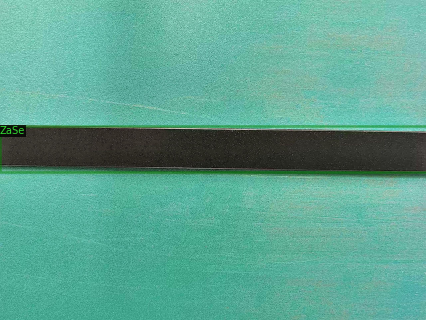

In [81]:
visualizer = Visualizer(bgr[:, :, ::-1], metadata=metadata, scale=0.5)    
vis = visualizer.draw_dataset_dict(dic)  
cv2_imshow(vis.get_image()[:, :, ::-1])

## 测试通过!!